In [4]:
import pandas as pd
import numpy as np
import pickle

In [3]:
#df=pd.read_csv('/content/drive/MyDrive/Scaler/Network_Anomaly/Network_anomaly_data.csv')

df=pd.read_csv("C:\\Users\\HARSHITH\\Documents\\GitHub\\Network Anomaly Detection\\Network_Anomaly_detection\\network-anomaly\\Network_anomaly_data.csv")

In [4]:
df.head()

,duration,protocoltype,service,flag,srcbytes,dstbytes,land,wrongfragment,urgent,hot,...,dsthostsamesrvrate,dsthostdiffsrvrate,dsthostsamesrcportrate,dsthostsrvdiffhostrate,dsthostserrorrate,dsthostsrvserrorrate,dsthostrerrorrate,dsthostsrvrerrorrate,attack,lastflag
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20
1,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19
3,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21
4,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21


In [5]:
## Identify shape of the data
print("Number of Rows in the dataset : ",df.shape[0])
print("Number of Columns in the dataset : ",df.shape[1])

Number of Rows in the dataset :  125973
Number of Columns in the dataset :  43


In [6]:
## Identify the datatypes and info in the given dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125973 entries, 0 to 125972
Data columns (total 43 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   duration                125973 non-null  int64  
 1   protocoltype            125973 non-null  object 
 2   service                 125973 non-null  object 
 3   flag                    125973 non-null  object 
 4   srcbytes                125973 non-null  int64  
 5   dstbytes                125973 non-null  int64  
 6   land                    125973 non-null  int64  
 7   wrongfragment           125973 non-null  int64  
 8   urgent                  125973 non-null  int64  
 9   hot                     125973 non-null  int64  
 10  numfailedlogins         125973 non-null  int64  
 11  loggedin                125973 non-null  int64  
 12  numcompromised          125973 non-null  int64  
 13  rootshell               125973 non-null  int64  
 14  suattempted         

There are 3 different datatypes present in dataset provided.

1. Float   --> 64 Features

2. Integer --> 24 Features

3. Object  --> 4 Features

In [7]:
# Identify Missing values or NULL values present in the dataset
df.isnull().sum()

duration                  0
protocoltype              0
service                   0
flag                      0
srcbytes                  0
dstbytes                  0
land                      0
wrongfragment             0
urgent                    0
hot                       0
numfailedlogins           0
loggedin                  0
numcompromised            0
rootshell                 0
suattempted               0
numroot                   0
numfilecreations          0
numshells                 0
numaccessfiles            0
numoutboundcmds           0
ishostlogin               0
isguestlogin              0
count                     0
srvcount                  0
serrorrate                0
srvserrorrate             0
rerrorrate                0
srvrerrorrate             0
samesrvrate               0
diffsrvrate               0
srvdiffhostrate           0
dsthostcount              0
dsthostsrvcount           0
dsthostsamesrvrate        0
dsthostdiffsrvrate        0
dsthostsamesrcportra

There are no missing or NULL values present in the dataset.

Features like duration,

In [8]:
##Descriptive Statistics for number type
cols= df.select_dtypes(include=np.number).columns.tolist()
col1=cols[0:10]
col2=cols[10:20]
col3=cols[20:30]
col4=cols[30:40]
print(df[col1].describe())
print(df[col2].describe())
print(df[col3].describe())
print(df[col4].describe())

           duration      srcbytes      dstbytes           land  wrongfragment  \
count  125973.00000  1.259730e+05  1.259730e+05  125973.000000  125973.000000   
mean      287.14465  4.556674e+04  1.977911e+04       0.000198       0.022687   
std      2604.51531  5.870331e+06  4.021269e+06       0.014086       0.253530   
min         0.00000  0.000000e+00  0.000000e+00       0.000000       0.000000   
25%         0.00000  0.000000e+00  0.000000e+00       0.000000       0.000000   
50%         0.00000  4.400000e+01  0.000000e+00       0.000000       0.000000   
75%         0.00000  2.760000e+02  5.160000e+02       0.000000       0.000000   
max     42908.00000  1.379964e+09  1.309937e+09       1.000000       3.000000   

              urgent            hot  numfailedlogins       loggedin  \
count  125973.000000  125973.000000    125973.000000  125973.000000   
mean        0.000111       0.204409         0.001222       0.395736   
std         0.014366       2.149968         0.045239     

Features like duration,wrongfragment,urgent,hot,numfailedlogs,numcompromised,numroot,numfilecreations,numshells and numaccessfiles are almost filled with 0's because these features have 0's at 25%,50% and 75%.

From the observation, Features such as land,loggedin,rootshell,suattempted,ishostlogin,isguestlogin are like binary type and are discrete.

Crucial Continuous features in the dataset are duration, srcbytes, dstbytes, count, srvcount, dsthostcount, dsthostsrvcount.

All the rate related features are having the range from 0 to 1.



In [9]:
##Descriptive statistics for Object type
df.describe(include='object')

,protocoltype,service,flag,attack
count,125973,125973,125973,125973
unique,3,70,11,23
top,tcp,http,SF,normal
freq,102689,40338,74945,67343


Features like protocoltype, service, flag and attack are nominal categorical features.

In [10]:
## Identifying no of unique values for each feature in the dataset.
for i in df.columns:
  print(i, ":", df[i].nunique())

duration : 2981
protocoltype : 3
service : 70
flag : 11
srcbytes : 3341
dstbytes : 9326
land : 2
wrongfragment : 3
urgent : 4
hot : 28
numfailedlogins : 6
loggedin : 2
numcompromised : 88
rootshell : 2
suattempted : 3
numroot : 82
numfilecreations : 35
numshells : 3
numaccessfiles : 10
numoutboundcmds : 1
ishostlogin : 2
isguestlogin : 2
count : 512
srvcount : 509
serrorrate : 89
srvserrorrate : 86
rerrorrate : 82
srvrerrorrate : 62
samesrvrate : 101
diffsrvrate : 95
srvdiffhostrate : 60
dsthostcount : 256
dsthostsrvcount : 256
dsthostsamesrvrate : 101
dsthostdiffsrvrate : 101
dsthostsamesrcportrate : 101
dsthostsrvdiffhostrate : 75
dsthostserrorrate : 101
dsthostsrvserrorrate : 100
dsthostrerrorrate : 101
dsthostsrvrerrorrate : 101
attack : 23
lastflag : 22


numoutboundcmds feature has only one unique value. So that feature has no significance and We can drop that feature.

In [11]:
##Identifying unique values for each feature present in the dataset that are less than or equal to 70.

for i in df.columns:
  if df[i].nunique() <=70:

     print(i,df[i].unique(),"",sep="\n")

protocoltype
['tcp' 'udp' 'icmp']

service
['ftp_data' 'other' 'private' 'http' 'remote_job' 'name' 'netbios_ns'
 'eco_i' 'mtp' 'telnet' 'finger' 'domain_u' 'supdup' 'uucp_path' 'Z39_50'
 'smtp' 'csnet_ns' 'uucp' 'netbios_dgm' 'urp_i' 'auth' 'domain' 'ftp'
 'bgp' 'ldap' 'ecr_i' 'gopher' 'vmnet' 'systat' 'http_443' 'efs' 'whois'
 'imap4' 'iso_tsap' 'echo' 'klogin' 'link' 'sunrpc' 'login' 'kshell'
 'sql_net' 'time' 'hostnames' 'exec' 'ntp_u' 'discard' 'nntp' 'courier'
 'ctf' 'ssh' 'daytime' 'shell' 'netstat' 'pop_3' 'nnsp' 'IRC' 'pop_2'
 'printer' 'tim_i' 'pm_dump' 'red_i' 'netbios_ssn' 'rje' 'X11' 'urh_i'
 'http_8001' 'aol' 'http_2784' 'tftp_u' 'harvest']

flag
['SF' 'S0' 'REJ' 'RSTR' 'SH' 'RSTO' 'S1' 'RSTOS0' 'S3' 'S2' 'OTH']

land
[0 1]

wrongfragment
[0 3 1]

urgent
[0 1 3 2]

hot
[ 0  5  6  4  2  1 28 30 22 24 14  3 15 25 19 18 77 17 11  7 20 12  9 10
  8 21 33 44]

numfailedlogins
[0 2 1 3 4 5]

loggedin
[0 1]

rootshell
[0 1]

suattempted
[0 1 2]

numfilecreations
[ 0  1  8  4  2 

To get clear understanding, we can categorise the service, flag and attack features.

Protocol Type has 3 unique features.
   TCP
   UDP
   ICMP



In [12]:
##Identifying value counts of values for each feature present in the dataset that are less than or equal to 70.

for i in df.columns:
  if df[i].nunique() <=70:

     print('\n',df[i].value_counts(),sep="\n")




protocoltype
tcp     102689
udp      14993
icmp      8291
Name: count, dtype: int64


service
http         40338
private      21853
domain_u      9043
smtp          7313
ftp_data      6860
             ...  
tftp_u           3
http_8001        2
aol              2
harvest          2
http_2784        1
Name: count, Length: 70, dtype: int64


flag
SF        74945
S0        34851
REJ       11233
RSTR       2421
RSTO       1562
S1          365
SH          271
S2          127
RSTOS0      103
S3           49
OTH          46
Name: count, dtype: int64


land
0    125948
1        25
Name: count, dtype: int64


wrongfragment
0    124883
3       884
1       206
Name: count, dtype: int64


urgent
0    125964
1         5
2         3
3         1
Name: count, dtype: int64


hot
0     123302
2       1037
1        369
28       277
30       256
4        173
6        140
5         76
24        68
19        57
22        55
3         54
18        45
14        30
20         9
7          5
15         4
11 

--> ***land, wrongfragment, urgent, hot, numfailedlogins, rootshell, suattempted, numfilecreations, numshells, numaccessfiles, ishostlogin, isguestlogin*** features are very high right skewed features because there are greater than 120000 records in these features as zero.

--> '***numoutboundcmds***' feature is not required as it has only one unique value.

In [13]:
#Identify range of values for numericval columns

for i in df.columns:
    if not isinstance(df[i][0],str):
        print(f"Maximum of {i}",df[i].max())
        print(f"Minimum of {i}",df[i].min())
        print()

Maximum of duration 42908
Minimum of duration 0

Maximum of srcbytes 1379963888
Minimum of srcbytes 0

Maximum of dstbytes 1309937401
Minimum of dstbytes 0

Maximum of land 1
Minimum of land 0

Maximum of wrongfragment 3
Minimum of wrongfragment 0

Maximum of urgent 3
Minimum of urgent 0

Maximum of hot 77
Minimum of hot 0

Maximum of numfailedlogins 5
Minimum of numfailedlogins 0

Maximum of loggedin 1
Minimum of loggedin 0

Maximum of numcompromised 7479
Minimum of numcompromised 0

Maximum of rootshell 1
Minimum of rootshell 0

Maximum of suattempted 2
Minimum of suattempted 0

Maximum of numroot 7468
Minimum of numroot 0

Maximum of numfilecreations 43
Minimum of numfilecreations 0

Maximum of numshells 2
Minimum of numshells 0

Maximum of numaccessfiles 9
Minimum of numaccessfiles 0

Maximum of numoutboundcmds 0
Minimum of numoutboundcmds 0

Maximum of ishostlogin 1
Minimum of ishostlogin 0

Maximum of isguestlogin 1
Minimum of isguestlogin 0

Maximum of count 511
Minimum of count

Scaling is required to apply because of various ranges.

In [14]:
## Copy existing dataframe to new dataframe for feature engineering

df1= df.copy()

## Feature Engineering

In [15]:
## As 'numoutboundcmds' feature  has only one unique value it can be removed.
df1=df1.drop(['numoutboundcmds'],axis=1)

In [16]:
## Converting 'suattempted' feature to binary
df1['suattempted']=df1['suattempted'].apply(lambda x : 0 if x == 0 else 1)
df1['suattempted'].value_counts()

suattempted
0    125893
1        80
Name: count, dtype: int64

In [17]:
## Adding new feature for features srcbytes and dstbytes transferred per second for a period of duration.
## It can be achieved by dividing srcbytes/duration

## New feature srcbytes/sec
df1['srcbytes/sec'] = df1.apply(lambda row : row['srcbytes']/row['duration'] if row['duration'] != 0 else row['srcbytes']/(row['duration'] + 0.001),axis=1 )

## New feature dstbytes/sec
df1['dstbytes/sec'] = df1.apply(lambda row : row['dstbytes']/row['duration'] if row['duration'] != 0 else row['dstbytes']/(row['duration'] + 0.001), axis=1)

In [18]:
##Creating new feature with  rate features with respective counts for Source hosts
## Create df1['serrorrate_count']
df1['serrorrate_count']=df1['serrorrate']*df1['count']

## Create df1['rerrorrate_count']
df1['rerrorrate_count']=df1['rerrorrate']*df1['count']

## Create df1['samesrvrate_count]
df1['samesrvrate_count']=df1['samesrvrate']*df1['count']

## Create df1['diffsrvrate_count']
df1['diffsrvrate_count']=df1['diffsrvrate']*df1['count']



In [19]:
##Create df1['srvserrorrate_count']
df1['srvserrorrate_count']=df1['srvserrorrate']*df1['srvcount']

##Create df1['srvrerrorrate_count']
df1['srvrerrorrate_count']=df1['srvrerrorrate']*df1['srvcount']

##Create df1['srvdiffhostrate_count']
df1['srvdiffhostrate_count']=df1['srvdiffhostrate']*df1['srvcount']

In [20]:
##Creating new feature with  rate features with respective counts for destination hosts

## Create df1[dsthosterrorrate_count']
df1['dsthostrerrorrate_count']=df1['dsthostserrorrate']*df1['dsthostcount']

## Create df1['dsthostserrorrate_count']
df1['dsthostserrorrate_count']=df1['dsthostserrorrate']*df1['dsthostcount']

## Create df1['dsthostsamesrvrate']
df1['dsthostsamesrvrate_count']=df1['dsthostsamesrvrate']*df1['dsthostcount']

## Create df1['dsthostdiffsrvrate']
df1['dsthostdiffsrvrate_count']=df1['dsthostdiffsrvrate']*df1['dsthostcount']


In [21]:
## Create df1['dsthostsrvserrorrate_count']
df1['dsthostsrvserrorrate_count']=df1['dsthostsrvserrorrate']*df1['dsthostsrvcount']

## Create df1['dsthostsrvrerrorrate_count']
df1['dsthostsrvrerrorrate_count']=df1['dsthostsrvrerrorrate']*df1['dsthostsrvcount']

## Create df1['dsthostsamesrcportrate_count']
df1['dsthostsamesrcportrate_count']=df1['dsthostsamesrcportrate']*df1['dsthostcount']

## Create df1['dsthostsrvdiffhostrate_count']
df1['dsthostsrvdiffhostrate_count']=df1['dsthostsrvdiffhostrate']*df1['dsthostsrvcount']



In [22]:
## Create new feature called "attack_or_normal" by replacing attack as 1 and Normal as 0

df1['attack_or_normal']= df['attack'].apply(lambda x : 0 if x == "normal" else 1)

In [23]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125973 entries, 0 to 125972
Data columns (total 60 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   duration                      125973 non-null  int64  
 1   protocoltype                  125973 non-null  object 
 2   service                       125973 non-null  object 
 3   flag                          125973 non-null  object 
 4   srcbytes                      125973 non-null  int64  
 5   dstbytes                      125973 non-null  int64  
 6   land                          125973 non-null  int64  
 7   wrongfragment                 125973 non-null  int64  
 8   urgent                        125973 non-null  int64  
 9   hot                           125973 non-null  int64  
 10  numfailedlogins               125973 non-null  int64  
 11  loggedin                      125973 non-null  int64  
 12  numcompromised                125973 non-nul

In [24]:
## Create a new feature called "service_category" Service group based on the type of Service it meant for
srv_ftp=['ftp_data','tftp_u','ftp','printer','uucp','uucp_path','printer','pm_dump']
srv_http=['http','http_443','http_2784','http_8001','gopher','whois','Z39_50','efs']
srv_other=['other','private','iso_tsap','eco_i','ecr_i','urp_i','urh_i','red_i','tim_i','sunrpc','X11','rje','auth','csnet_ns', 'aol','ctf','finger','vmnet','link','harvest','courier','time','exec','bgp', 'daytime']
srv_ras=['telnet','shell','ssh','kshell','klogin','login','supdup','rje','remote_job']
srv_msg =['imap4','pop_3', 'smtp', 'pop_2','nntp','IRC','nnsp']
srv_nw_dns=['netbios_dgm','hostnames','domain' , 'netbios_ns', 'netbios_ssn' ,'domain_u','ntp_u','name']
srv_nw_error=['netstat','echo','systat','discard']
srv_ad=['ldap','sql_net']
for i in range(df1.shape[0]):
  if df1['service'][i] in srv_ftp:
    df1.loc[i, 'service_category']='File Transfer Services'
  elif df1['service'][i] in srv_http:
    df1.loc[i, 'service_category']='Application/web Services'
  elif df1['service'][i] in srv_other:
    df1.loc[i, 'service_category']='Others/legacy Services'
  elif df1['service'][i] in srv_ras:
    df1.loc[i, 'service_category']='Remote Access Services'
  elif df1['service'][i] in srv_msg:
    df1.loc[i, 'service_category']='Messaging Services'
  elif df1['service'][i] in srv_nw_dns:
    df1.loc[i, 'service_category']='Network & Name Server Services'
  elif df1['service'][i] in srv_nw_error:
    df1.loc[i, 'service_category']='Network Tshoot Error Services'
  else:
    df1.loc[i, 'service_category']='AD and DB Services'

In [25]:
## Create a new feature called "flag_category" Flag group based on their type.
Success_Flag = ['SF']
S_Flag = ['S0', 'S1', 'S2', 'S3']
R_Flag = ['REJ']
Reset_Flag = ['RSTR', 'RSTO', 'RSTOS0']
SH_Oth_Flag = ['SH','OTH']

for j in range(df1.shape[0]):
  if df1['flag'][j] in Success_Flag:
    df1.loc[j, 'flag_category']='Success Flag'
  elif df1['flag'][j] in S_Flag:
    df1.loc[j, 'flag_category']='S Flag'
  elif df1['flag'][j] in R_Flag:
    df1.loc[j, 'flag_category']='R Flag'
  elif df1['flag'][j] in Reset_Flag:
    df1.loc[j, 'flag_category']='Reset Flag'
  else:
    df1.loc[j, 'flag_category']='SH&Oth Flag'

In [26]:
df1['flag_category'].value_counts()

flag_category
Success Flag    74945
S Flag          35392
R Flag          11233
Reset Flag       4086
SH&Oth Flag       317
Name: count, dtype: int64

In [27]:
## Shape of data after feature Engineering

print("Number of Rows in the dataset : ",df1.shape[0])
print("Number of Columns in the dataset : ",df1.shape[1])

Number of Rows in the dataset :  125973
Number of Columns in the dataset :  62


## Data Visualisation

In [28]:
## Univariate Analysis



In [29]:
con_cols=df1.select_dtypes(include='number').columns

In [30]:
cat_cols=df1.select_dtypes(include='object').columns

In [31]:
cat_cols

Index(['protocoltype', 'service', 'flag', 'attack', 'service_category',
       'flag_category'],
      dtype='object')

In [32]:
## Importing matplotlib libraries for data visualisation.
import matplotlib.pyplot as plt
import seaborn as sns
import math

In [33]:
##Univariate Analysys.
##Plotting all Numerical variables.
num_cols=4
fig=plt.figure(figsize=(num_cols*10, len(con_cols)*10/num_cols))
plt.suptitle("hist plots for all numerical columns\n",fontsize=24)
k=1
for i in con_cols:
    plt.subplot(math.ceil(len(con_cols)/num_cols),num_cols,k)
    plt.title("{}".format(i),fontsize = 20)
    k += 1
    plot = sns.histplot(data=df1,x = i,kde = True,bins = 20)
    plt.xlabel("")
    plt.ylabel("")
plt.tight_layout()
plt.show()


--> Most of the features in the dataset are high at 0 and are having high right skewed distribution.

--> dsthostcount and dsthostsrvcount are left skewed distributions having peaks on both sides. If one side is high , other side will have low side and vice versa.  Similar behaviour can be observed on dsthostsamesrvrate_count.

--> All rate related features are having 2 peaks. One side is high and other side is low and vice versa.


--> count and srvcount are right skewed distribution with have minor difference in data distribution.

--> Attacked or normal and logged in features are having binary type and the data is balanced we can apply supervised algorithm to verify the data.

In [34]:
## Plotting attack or normal type as hue  on Numerical category

num_cols=4
fig=plt.figure(figsize=(num_cols*10, len(con_cols)*10/num_cols))
plt.suptitle("kde plots for all numerical columns using normal_or_attack using hue\n",fontsize=24)
k=1
for i in con_cols:
    plt.subplot(math.ceil(len(con_cols)/num_cols),num_cols,k)
    plt.title("{}".format(i),fontsize = 20)
    k += 1
    plot = sns.kdeplot(data=df1,x = i,hue='attack_or_normal')
    plt.xlabel("")
    plt.ylabel("")
plt.tight_layout()
plt.show()



C:\Users\HARSHITH\AppData\Local\Temp\ipykernel_25356\990733544.py:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  plot = sns.kdeplot(data=df1,x = i,hue='attack_or_normal')
C:\Users\HARSHITH\AppData\Local\Temp\ipykernel_25356\990733544.py:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  plot = sns.kdeplot(data=df1,x = i,hue='attack_or_normal')
C:\Users\HARSHITH\AppData\Local\Temp\ipykernel_25356\990733544.py:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  plot = sns.kdeplot(data=df1,x = i,hue='attack_or_normal')


--> wrongfragment is giving the right insight regarding the attack. Along with that dsthostcount and dsthostsrvcount also gives good insight regarding the attack.

-->There are some features which signifies the attack. The features are Count, Serrorrate, Rerrorrate, samesrvrate, diffsrvrate, srvserrorrate, srvrerrorrate, dsthostcount, dsthostsrvcount, dsthostserrorrate, dsthostrerrorrate, dsthost_samesrv_count, dsthost_diffsrv_count are having significant difference between attack and normal.

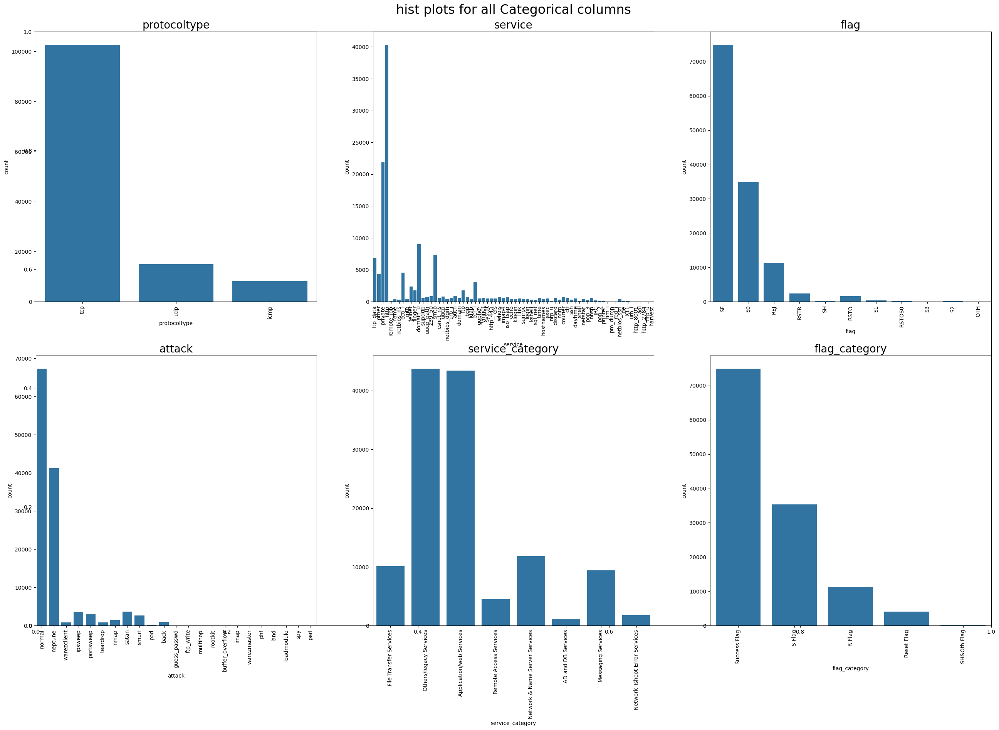

In [35]:
##Plotting all categorical variables.
num_cols=3
k=1
fig=plt.figure(figsize=(32,20))
plt.title("hist plots for all Categorical columns\n",fontsize=24)
for i in cat_cols:
  plt.subplot(math.ceil(len(cat_cols)/num_cols),num_cols,k)
  plt.title("{}".format(i),fontsize = 20)
  plt.xticks(rotation= 90)
  k += 1
  plot = sns.countplot(data=df1,x = i)
plt.show()


TCP protocol is the top most used protocol for establishing the connection before data transfer.
HTTP and Private service is highly utilised for data transfer.
SF flag which is used to close the existing TCP session  is more when compared to other flags.
Neptune type attack is more when comapared to other attacks.
Others category and application/web services are more.


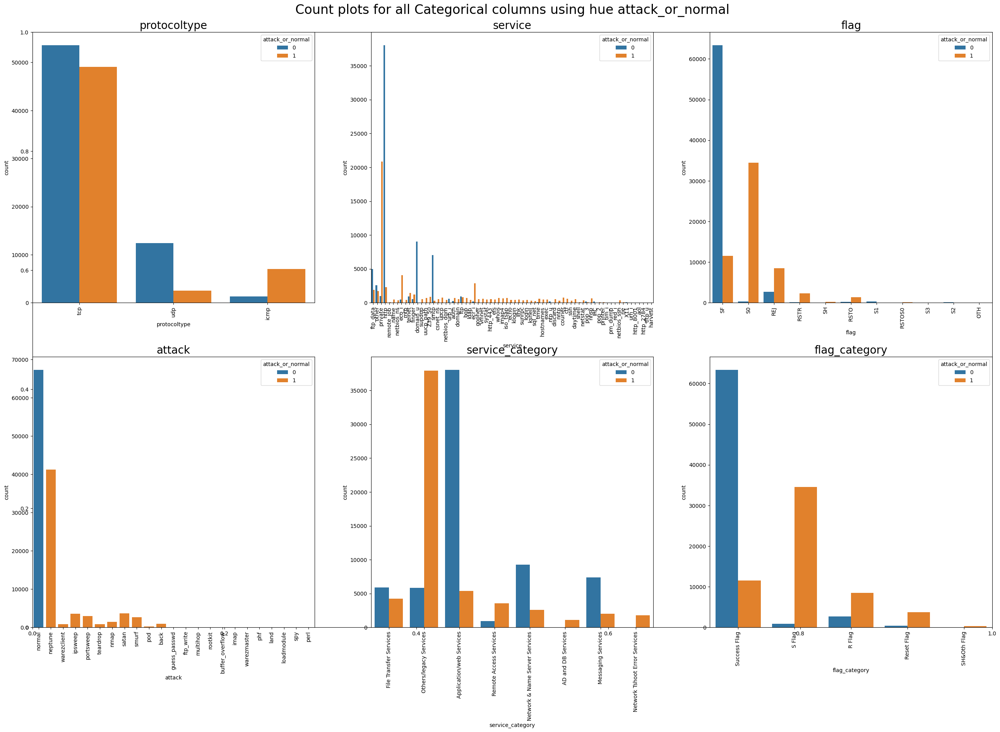

In [36]:
##Plotting all categorical variables.
num_cols=3
k=1
fig=plt.figure(figsize=(32,20))
plt.title("Count plots for all Categorical columns using hue attack_or_normal\n",fontsize=24)
for i in cat_cols:
  plt.subplot(math.ceil(len(cat_cols)/num_cols),num_cols,k)
  plt.title("{}".format(i),fontsize = 20)
  plt.xticks(rotation= 90)
  k += 1
  plot = sns.countplot(data=df1,x = i,hue='attack_or_normal')
plt.show()

--> attack dominates normal in icmp protocoltype.

--> attack dominates normal in all Flags except SF.

--> attack dominates in private service type and Mothers/legacy Services

In [37]:
## Boxplot
len(con_cols)

56

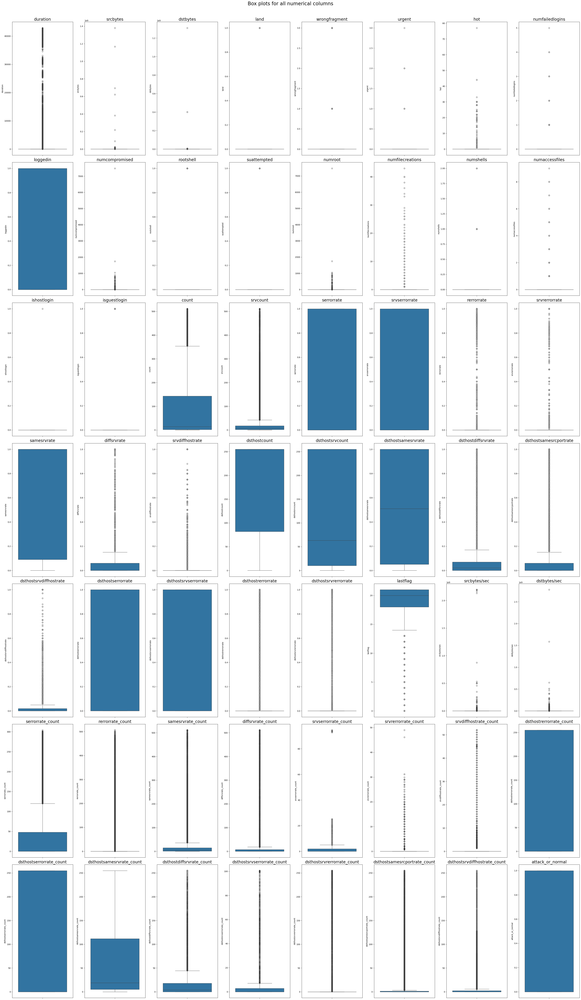

In [38]:
fig = plt.figure(figsize = (8*5,len(con_cols)*5/(8/2)))

plt.suptitle("Box plots for all numerical columns\n",fontsize=24)
k=1
for i in con_cols:
  plt.subplot(math.ceil(len(con_cols)/8),8,k)
  plt.title("{}".format(i),fontsize = 20)
  plt.xticks(rotation= 90)
  k += 1
  plot = sns.boxplot(data=df1,y = i)

plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()

There are so many outliers because most of the distribution lies at 0.
Let remove 0's and check still there are outlier's.

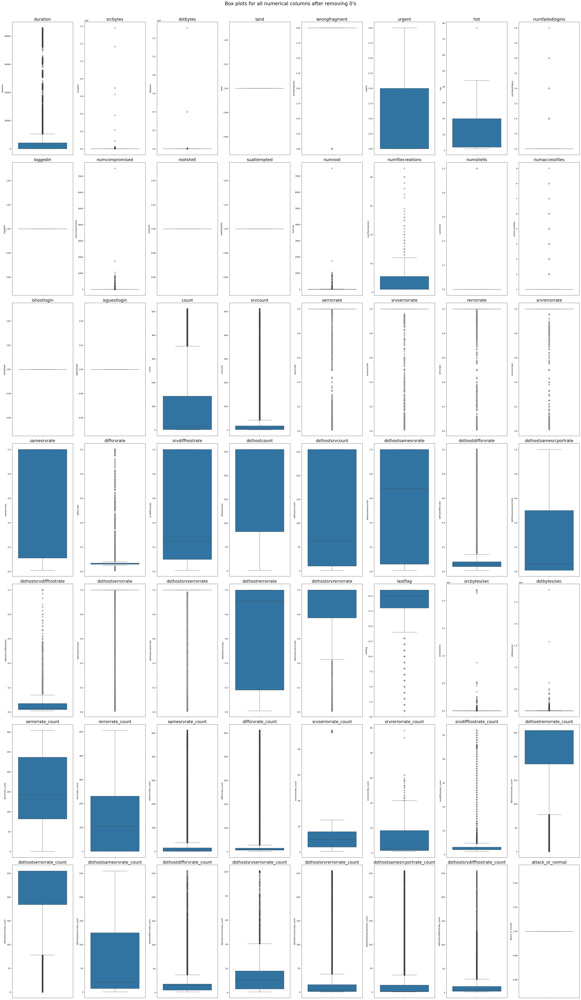

In [39]:
fig = plt.figure(figsize = (8*5,len(con_cols)*5/(8/2)))

plt.suptitle("Box plots for all numerical columns after removing 0's\n",fontsize=24)
k=1
for i in con_cols:
  plt.subplot(math.ceil(len(con_cols)/8),8,k)
  plt.title("{}".format(i),fontsize = 20)
  plt.xticks(rotation= 90)
  k += 1
  plot = sns.boxplot(data=df1[df1[i] !=0],y = i)

plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()

After treating the distribution by removing zero's , still there are lot of outlier's.

After identification of the outliers we need to handle them in various ways. Below are some of the methods:

Trimming/ Removing the outliers
Imputation of the outliers with certain values (Mean, Median etc.)
Transforming the outliers
Some of the methods for transformation include:

Log Transformation
Box-Cox Transformation
Cube Root Normalization
Square Root
Scaling etc.



c:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1153: UserWarning: The optimal lambda is -364.72902966557194, but the returned lambda is the constrained optimum to ensure that the maximum or the minimum of the transformed data does not overflow in float64.
  lmax = boxcox_normmax(x, method='mle', optimizer=optimizer)
c:\ProgramData\anaconda3\Lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
c:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1153: UserWarning: The optimal lambda is -987.8857193586471, but the returned lambda is the constrained optimum to ensure that the maximum or the minimum of the transformed data does not overflow in float64.
  lmax = boxcox_normmax(x, method='mle', optimizer=optimizer)
c:\ProgramData\anaconda3\Lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, ax

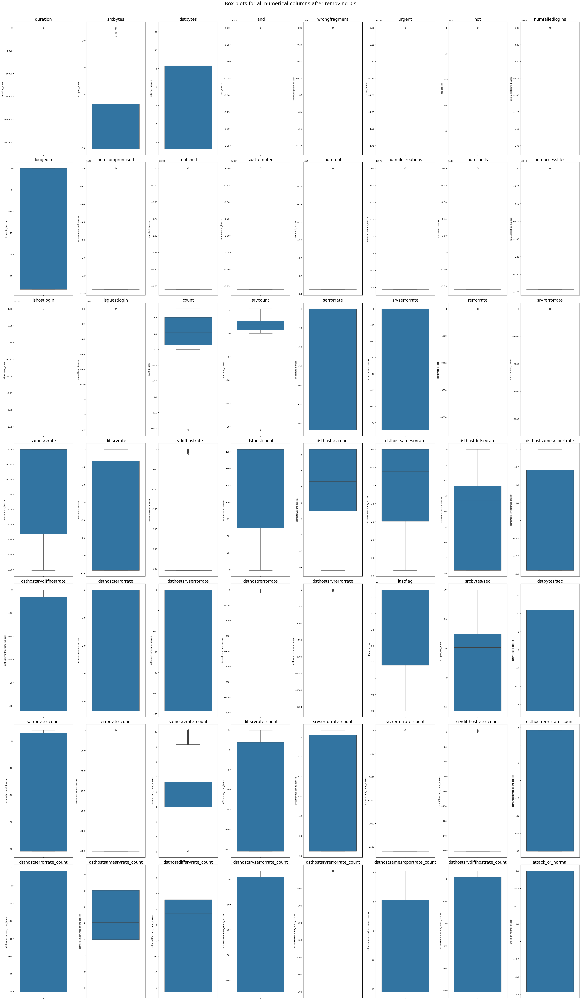

In [40]:
#Note: Boxcox transformation cannot handle 0 or negative values. To handle this,
#we are add a small constant to the values which are 0
from scipy import stats
df1_boxcox=df1.copy()
fig = plt.figure(figsize = (8*5,len(con_cols)*5/(8/2)))
outlier_counts = pd.Series(0, index=df1_boxcox.index)
plt.suptitle("Box plots for all numerical columns after removing 0's\n",fontsize=24)
k=1
for i in con_cols:


  df1_boxcox[i + '_boxcox'],_=stats.boxcox(df1_boxcox[i]+0.000001,lmbda=None)
  plt.subplot(math.ceil(len(con_cols)/8),8,k)
  plt.title("{}".format(i),fontsize = 20)
  plt.xticks(rotation= 90)
  k += 1
  plot = sns.boxplot(data=df1_boxcox,y = i + '_boxcox')
  # Identify outliers using IQR
  Q1 = df1_boxcox[i].quantile(0.25)
  
  
  Q3 = df1_boxcox[i].quantile(0.75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR




  # Flag outliers for this column
  is_outlier = (df1_boxcox[i] < lower_bound) | (df1_boxcox[i] > upper_bound)
  outlier_counts += is_outlier.astype(int)  # Increment outlier count for each row
  df1_boxcox['Features_Outlier_Count']=outlier_counts


plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()

In [41]:
df1_boxcox['Features_Outlier_Count'].head()

0    3
1    4
2    3
3    5
4    2
Name: Features_Outlier_Count, dtype: int64

In [42]:
df1_boxcox[df1_boxcox["attack_or_normal"] == 0]["Features_Outlier_Count"].value_counts()

Features_Outlier_Count
2     19479
4     15102
3      9043
5      7213
0      4881
1      4106
6      2601
7      1541
9      1360
10      741
8       563
11      414
12      271
13       20
14        4
15        3
16        1
Name: count, dtype: int64

In [43]:
df1_boxcox[df1_boxcox["attack_or_normal"] == 1]["Features_Outlier_Count"].value_counts()

Features_Outlier_Count
3     15787
2     11442
7      8056
1      6697
5      3988
12     2575
4      2018
6      1940
11     1575
0      1327
8      1120
10      811
9       606
14      282
13      272
15      121
16       13
Name: count, dtype: int64

<Axes: xlabel='Features_Outlier_Count', ylabel='Density'>

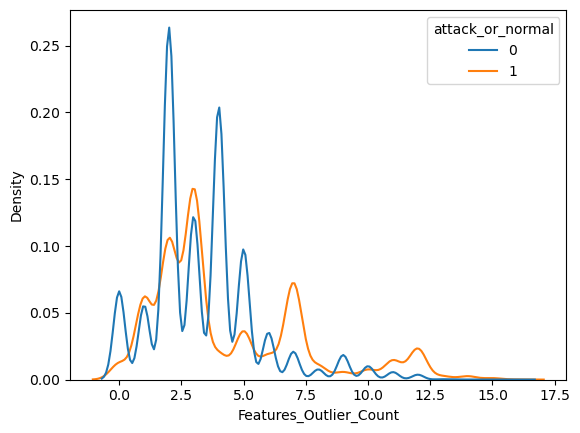

In [44]:
sns.kdeplot(data=df1_boxcox,x = "Features_Outlier_Count",hue = "attack_or_normal")

--> Post applying Boxcox Transformations , we can be able to remove most number of outliers.

--> We have created a new dataset to check data distribution if outliers are removed but it is not advisible to remove because they consider as anomalies.

--> We can see 2,4,5,3,0,1 are the top 5 Normal and 3,2,7,12 1 are the top 5 Attacks

In [45]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125973 entries, 0 to 125972
Data columns (total 62 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   duration                      125973 non-null  int64  
 1   protocoltype                  125973 non-null  object 
 2   service                       125973 non-null  object 
 3   flag                          125973 non-null  object 
 4   srcbytes                      125973 non-null  int64  
 5   dstbytes                      125973 non-null  int64  
 6   land                          125973 non-null  int64  
 7   wrongfragment                 125973 non-null  int64  
 8   urgent                        125973 non-null  int64  
 9   hot                           125973 non-null  int64  
 10  numfailedlogins               125973 non-null  int64  
 11  loggedin                      125973 non-null  int64  
 12  numcompromised                125973 non-nul

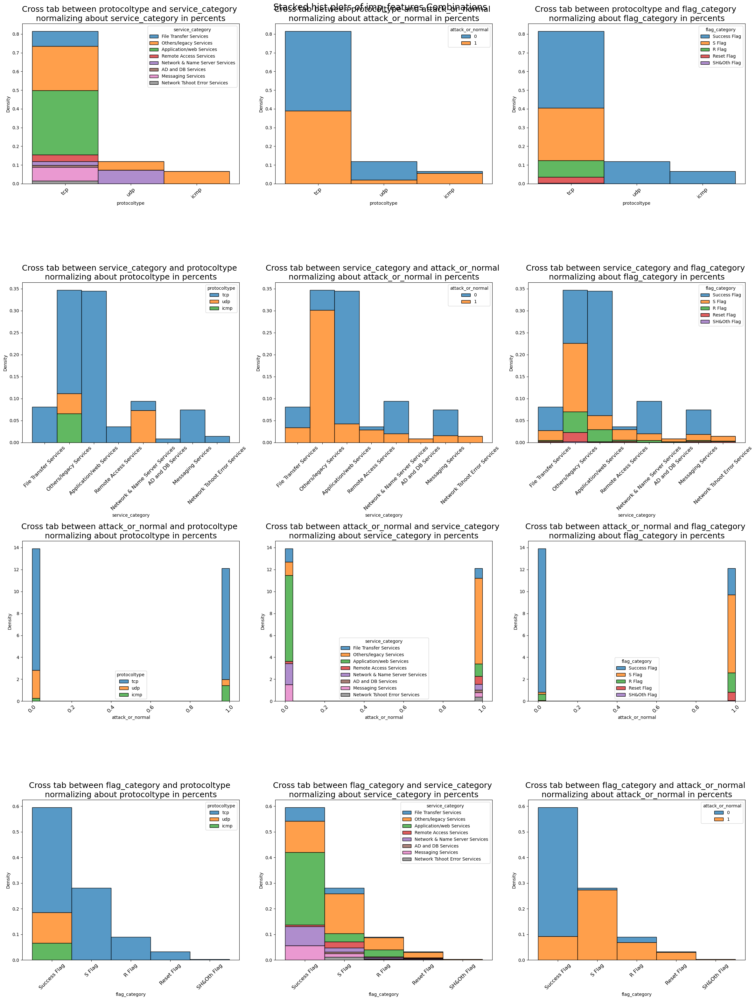

In [46]:
##Bivariate Analysis
#Plotting the graph for features which gives better understanding of participation in analysing Network Anomalies. They are protocol type, Servicetype,attack and flags.
#Create a list for plotting graph for 2 variables.it creates total 12 combinations
imp_cols=['protocoltype','service_category','attack_or_normal','flag_category']
cross_cols=[]
for i in imp_cols:
  for j in imp_cols:
    if i !=j:
      cross_cols.append((i,j))

num_cols=3
fig=plt.figure(figsize=(num_cols*8,len(cross_cols) * 8 / num_cols))
plt.suptitle("Stacked hist plots of imp_features Combinations\n", fontsize=20)
k=1
for i,j in cross_cols:
  plt.subplot(math.ceil(len(cross_cols)/num_cols),num_cols,k)
  plt.title(f"Cross tab between {i} and {j} \nnormalizing about {j} in percents", fontsize=18)

  plt.xticks(rotation= 45,fontsize = 12)

  k += 1
  sns.histplot(data=df1,x=i,hue=j,multiple='stack',stat='density')
plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()

--> tcp has dominated by Miscellaneous and Legacy Services only. udp has only two types of services others and Legacy Services and Newtwork  and name  Services.


-->tcp has totally success flag but it also has mostly attacked.
Error Flag distribution is high in Database and Directory Services, Error and Diagnostic services, Remote access and control services. That means, System able to flag properly in these services.


-->Database and Directory Services, Error and Diagnostic services has dominated by attack categories only.


-->Unable to flag properly in udp & icmp protocoltype.


-->S Flag has mostly DOS attack category. SH&OTH Flag has mostly Probe attack category.
R2L uses only tcp protocol.

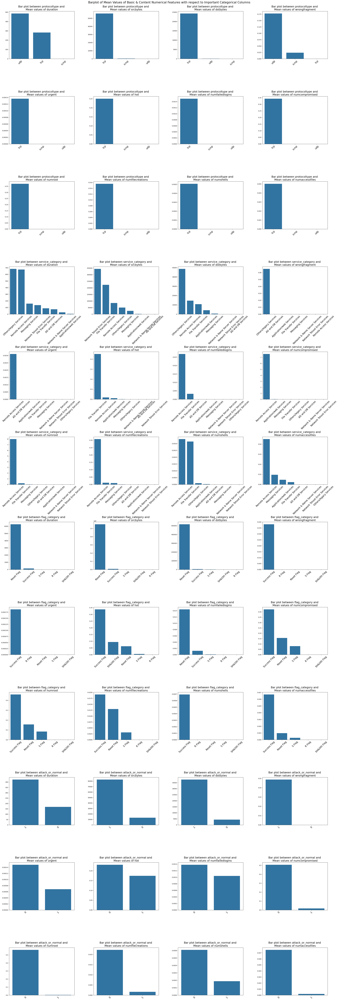

In [47]:
## Plot the graph Numerical vs Categorical

cat_features = ['protocoltype', 'service_category', 'flag_category', 'attack_or_normal']
cont_features = ['duration', 'srcbytes','dstbytes','wrongfragment','urgent','hot','numfailedlogins',
                     'numcompromised','numroot','numfilecreations','numshells','numaccessfiles']
cat_cont = []
for i in range(len(cat_features)):
    for j in range(len(cont_features)):
        if (df1[cat_features[i]].nunique()<50):
            cat_cont.append((cat_features[i], cont_features[j]))


num_cols = 4
fig = plt.figure(figsize=(num_cols * 8, len(cat_cont) * 8 / num_cols))
plt.suptitle("Barplot of Mean Values of Basic & Content Numerical Features with respect to Important Categorical Columns\n", fontsize=20)
k = 1

for p, q in cat_cont:
    plt.subplot(math.ceil(len(cat_cont) / num_cols), num_cols, k)
    plt.title(f"Bar plot between {p} and \nMean values of {q}", fontsize=18)
    k += 1

    # Plot the histogram with stacked bars and store the axis object
    df = pd.DataFrame(df1.groupby([p])[[q]].mean().reset_index())
    sns.barplot(data = df,x = p,y= q,order = df.sort_values(q,ascending = False)[p])

    # Set x-axis tick label font size
    plt.xticks(rotation=45, fontsize=16)
    plt.xlabel("")  # No xlabel to keep plots clean
    plt.ylabel("")  # No ylabel to keep plots clean

    #warnings.filterwarnings('ignore')

plt.tight_layout()
plt.subplots_adjust(top=0.97)
plt.show()
#warnings.filterwarnings('ignore')

--> udp dominates in avg duration & avg wrongfragments. In remaining all numerical features, tcp dominates.

-->Others and Legacy Services dominates in avg duration, avg dstbytes, avg wrong fragments.

-->Error and Diagnostic Services dominates in avg srcbytes.

-->Remote Access and Control Services dominates in urgent packets, numfailedlogins, numcompromised, numroot, numfilecreations, numshells, numaccessfiles.

-->File Transfer and Storage Services dominates in hot indicators.

-->Reset Flag dominates in avg duration, avg srcbytes, avg dstbytes, avg numfailedlogins. Remaining numerical features are dominated by Success flag.

-->Attack dominates in durtion,src_bytes,dstbytes,wrongfragment and remaining Normal dominates.But attacks happened on numshells,numfilecreation,numfailedlogins,hot and urgent.

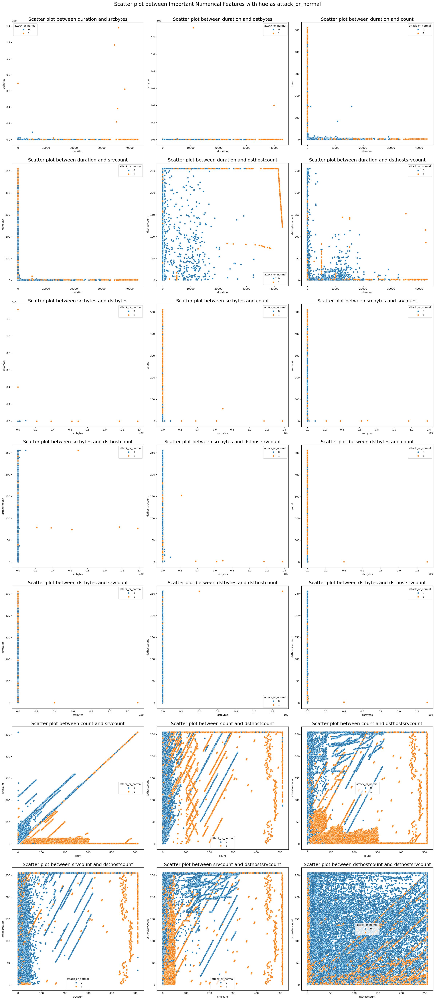

In [48]:
##Plot num vs num
from itertools import combinations # Import the combinations function

imp_cont_cols = ['duration','srcbytes', 'dstbytes','count', 'srvcount','dsthostcount', 'dsthostsrvcount']
cont_comb = list(combinations(imp_cont_cols,2))
num_cols = 3
fig = plt.figure(figsize=(num_cols * 8, len(cont_comb) * 8 / num_cols))
plt.suptitle("Scatter plot between Important Numerical Features with hue as attack_or_normal\n", fontsize=20)
k = 1

for p, q in cont_comb:
    plt.subplot(math.ceil(len(cont_comb) / num_cols), num_cols, k)
    plt.title(f"Scatter plot between {p} and {q}", fontsize=18)
    k += 1
    sns.scatterplot(data = df1,x=p,y=q,hue = "attack_or_normal")
    #warnings.filterwarnings('ignore')

plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()

--> Among all the plots, clear distinction between attack and normal can be seen in count vs srvcount and dstsrvcount.

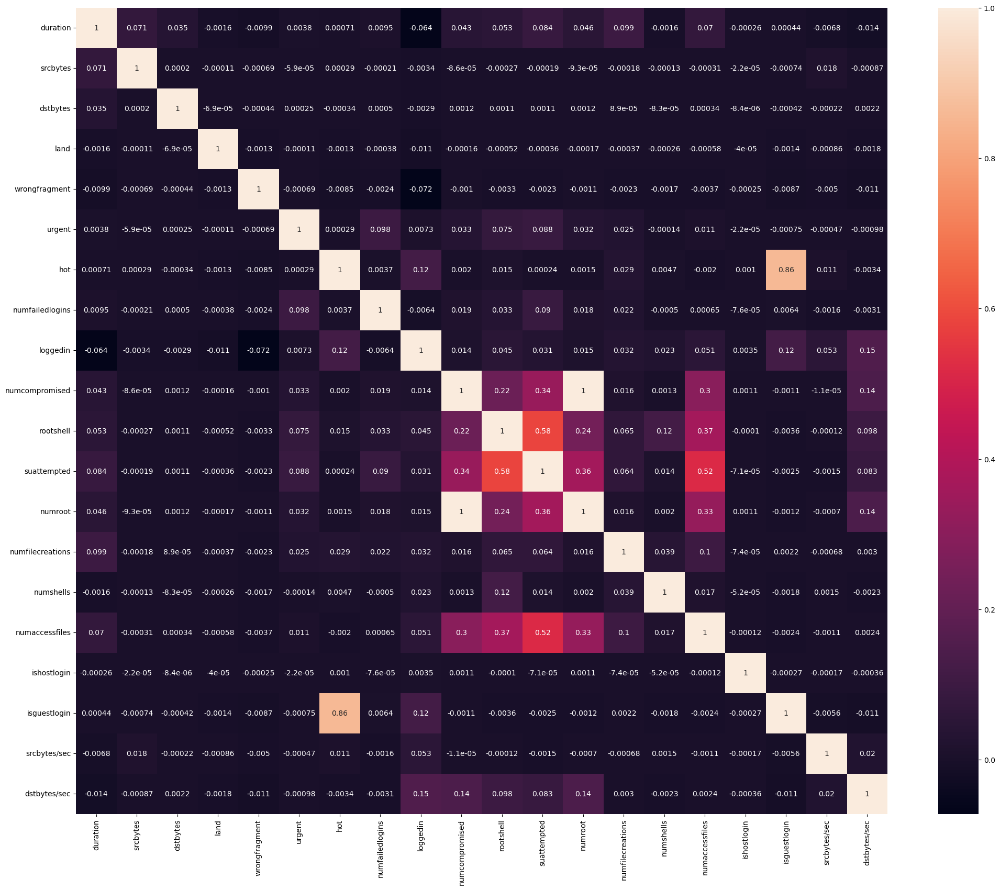

In [49]:
##Correlation Maps
cols = ['duration', 'protocoltype', 'service', 'flag', 'srcbytes', 'dstbytes','land', 'wrongfragment', 'urgent', 'hot', 'numfailedlogins', 'loggedin','numcompromised', 'rootshell', 'suattempted', 'numroot','numfilecreations', 'numshells', 'numaccessfiles', 'ishostlogin','isguestlogin','srcbytes/sec', 'dstbytes/sec']
corr=df1[cols].corr(numeric_only=True)
plt.figure(figsize=(25,20))
sns.heatmap(corr,annot=True)
plt.show()

--> Correlation > 0.80 is observed between isguestlogin and hot.

--> Coorelation > 0.5 is observed between rootshell and suattempted.

--> Remaining all combinations we didnt see much correlation.

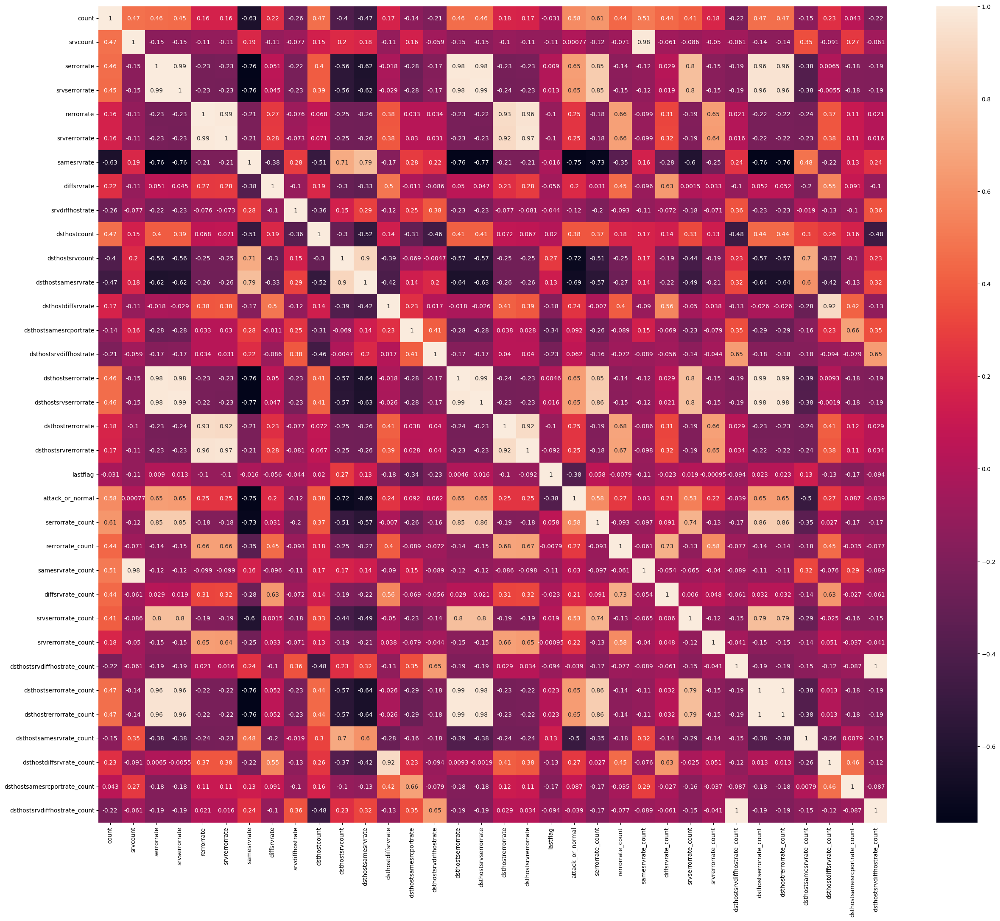

In [50]:
cols = ['count', 'srvcount', 'serrorrate', 'srvserrorrate',
       'rerrorrate', 'srvrerrorrate', 'samesrvrate', 'diffsrvrate',
       'srvdiffhostrate', 'dsthostcount', 'dsthostsrvcount',
       'dsthostsamesrvrate', 'dsthostdiffsrvrate', 'dsthostsamesrcportrate',
       'dsthostsrvdiffhostrate', 'dsthostserrorrate', 'dsthostsrvserrorrate',
       'dsthostrerrorrate', 'dsthostsrvrerrorrate', 'attack', 'lastflag',
       'attack', 'service_category', 'flag_category',
       'attack_or_normal', 'serrorrate_count', 'rerrorrate_count', 'samesrvrate_count',
       'diffsrvrate_count', 'srvserrorrate_count', 'srvrerrorrate_count',
       'dsthostsrvdiffhostrate_count', 'dsthostserrorrate_count',
       'dsthostrerrorrate_count', 'dsthostsamesrvrate_count',
       'dsthostdiffsrvrate_count',  'dsthostsamesrcportrate_count',
       'dsthostsrvdiffhostrate_count']

corr = df1[cols].corr(numeric_only=True)
plt.figure(figsize=(30,25))
sns.heatmap(corr,annot=True)
plt.show()


Positive correlation > 0.9 is observed between

-->srvserrorrate and serrorrate correlation: 0.99

-->dsthostserrorrate and serrorrate correlation: 0.98

-->dsthostsrvserrorrate and serrorrate correlation: 0.98

-->dsthostserrorrate and srvserrorrate correlation: 0.98

-->dsthostsrvserrorrate and srvserrorrate correlation: 0.99

-->samesrvrate_count and srvcount correlation: 0.98

-->dsthostrerrorrate_count and serrorrate correlation: 0.96

-->dsthostserrorrate_count and serrorrate correlation: 0.96

-->dsthostrerrorrate_count and srvserrorrate correlation: 0.96

-->dsthostserrorrate_count and srvserrorrate correlation: 0.96

-->srvrerrorrate and rerrorrate correlation: 0.99

-->dsthostrerrorrate and rerrorrate correlation: 0.93

-->dsthostsrvrerrorrate and rerrorrate correlation: 0.96

-->dsthostsrvrerrorrate and srvrerrorrate correlation: 0.97

-->dsthostrerrorrate and srvrerrorrate correlation: 0.92

-->dsthostdiffsrv_count and dsthostdiffsrvrate correlation: 0.92

-->dsthostsrvserrorrate and dsthostserrorrate correlation: 0.99

-->dsthostserror_count and dsthostserrorrate correlation: 0.99

-->dsthostserrorrate  and dsthostrerrorrate_count correlation  : 0.99

-->dsthostsrvserrorrate and dsthostserrorrate_count correlation  : 0.98

-->dsthostsrvserrorrate and dsthostrerrorrate_count correlation  : 0.98

-->dsthostsrvrerrorrate and dsthostrerrorrate correlation: 0.92

-->SAMESRVRATE_COUNT  and srvcount correlation : 0.98

-->dsthostrerrorrate_count and srverrorrate correlation: 0.96

-->dsthostrerrorrate_count and serrorrate correlation: 0.96

-->dsthostserrorrate_count and srverrorrate correlation: 0.96

-->dsthostserrorrate_count and serrorrate correlation: 0.96

-->dsthostserrorrate  and dsthostserrorrate_count correlation  : 0.99

-->dsthostserrorrate_count and dsthostsrvserrorrate correlation: 0.98

-->dsthostserrorrate  and dsthostrerrorrate_count correlation  : 0.99

-->dsthostrerrorrate_count and dsthostsrvserrorrate correlation: 0.98

-->dsthostdiffsrvrate_count and dsthostdiffsrvrate correlation :0.92




Negative correlation < -0.7 is observed between

-->dsthostserrorrate and samesrvrate correlation: -0.76

-->dsthostrerrorrate and samesrvrate correlation: -0.76

-->dsthostsrvserrorrate and samesrvrate correlation: -0.77

-->Samesrvrate and serrorrate correlation: -0.76

-->samesrvrate and srvserrorrate correlation: -0.76

-->attack_or_normal and samesrvrate correlation: -0.75

-->attack_or_normal and dsthostsrvcount correlation: -0.72

-->serrors_count and samesrvrate correlation: -0.73

-->dsthostserrorrate_count and samesrvrate correlation: -0.76

 ##**HYPOTHESIS TESTING**

 NETWORK TRAFFIC VOLUME AND ANOMALIES

In [51]:
##Hypothesis Tests

#Hypothesis: Network connections with unusually high or low traffic volume (bytes transferred) are more likely to be anomalous.
##Ho: Network connections with unusually high or low traffic volume (bytes transferred) are  more likely to be anomalous.
##H1: Network connections with unusually high or low traffic volume (bytes transferred) are not more likely to be anomalous.

srcbytes_normal = df1[df1["attack_or_normal"] == 0]["srcbytes"]
srcbytes_attack = df1[df1["attack_or_normal"] == 1]["srcbytes"]

In [ ]:
from scipy import stats
alpha=0.05
t_statistics, p_value = stats.ttest_ind(srcbytes_normal, srcbytes_attack)
print("T-statistic:", t_statistics)
print("P-value:", p_value)

if p_value < alpha:
  print("Ho: Network connections with unusually high or low traffic volume (bytes transferred) are  more likely to be anomalous.")
else:
  print("H1: Network connections with unusually high or low traffic volume (bytes transferred) are not more likely to be anomalous.")

T-statistic: -2.101656020563486
P-value: 0.03558539933331456
Ho: Network connections with unusually high or low traffic volume (bytes transferred) are  more likely to be anomalous.


In [53]:
dstbytes_normal = df1[df1["attack_or_normal"] == 0]["dstbytes"]
dstbytes_attack = df1[df1["attack_or_normal"] == 1]["dstbytes"]
t_statistics, p_value = stats.ttest_ind(dstbytes_normal, dstbytes_attack)
print("T-statistic:", t_statistics)
print("P-value:", p_value)

if p_value < alpha:
  print("Ho: Network connections with unusually high or low traffic volume (bytes transferred) are  more likely to be anomalous.")
else:
  print("H1: Network connections with unusually high or low traffic volume (bytes transferred) are not more likely to be anomalous.")

T-statistic: -1.4614241258205836
P-value: 0.14390157812640422
H1: Network connections with unusually high or low traffic volume (bytes transferred) are not more likely to be anomalous.


##Impact of Protocol Type on Anomaly Detection:

In [54]:
##Hypothesis: Certain protocols are more frequently associated with network anomalies.

Protocoltype = df1["protocoltype"]
Attack_or_normal = df1["attack_or_normal"]
# Create a contingency table
contingency_table = pd.crosstab(Protocoltype, Attack_or_normal)

In [55]:
#Null Hypothesis H0: protocoltype does not influence whether a connection is classified as attack_or_normal.

#Alternate Hypothesis Ha: protocoltype does influence whether a connection is classified as attack_or_normal
from scipy.stats import chi2_contingency
alpha = 0.05
chi2, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-square Statistic: {chi2}")
print(f"P-value: {p_value}")
print(f"Degrees of Freedom: {dof}")
print("Expected Frequencies:")
print(expected)
if p_value <= alpha:
    print("As p_value <= 0.05, We reject the null hypothesis of chi2_contingency test i.e., protocoltype does influences whether a connection is classified as attack_or_normal.")
else:
    print("As p_value > 0.05, We cannot reject the null hypothesis of chi2_contingency test i.e., protocoltype does not influences whether a connection is classified as attack_or_normal.")

Chi-square Statistic: 10029.24862778463
P-value: 0.0
Degrees of Freedom: 2
Expected Frequencies:
[[ 4432.22605638  3858.77394362]
 [54895.77391187 47793.22608813]
 [ 8015.00003175  6977.99996825]]
As p_value <= 0.05, We reject the null hypothesis of chi2_contingency test i.e., protocoltype does influences whether a connection is classified as attack_or_normal.


##ROLE OF SERVICE IN NETWORK SECURITY

In [56]:
##Hypothesis: Specific services are targets of network anomalies more often than others.
# H0:service type does influences whether a connection is classified as attack_or_normal.
#Ha :service type does not influences whether a connection is classified as attack_or_normal.

Service = df1["service"]
Attack_or_normal = df1["attack_or_normal"]
# Create a contingency table
contingency_table = pd.crosstab(Service, Attack_or_normal)

chi2, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-square Statistic: {chi2}")
print(f"P-value: {p_value}")
print(f"Degrees of Freedom: {dof}")
if p_value <= alpha:
    print("As p_value <= 0.05, We reject the null hypothesis of chi2_contingency test i.e., service type does influences whether a connection is classified as attack_or_normal.")
else:
    print("As p_value > 0.05, We cannot reject the null hypothesis of chi2_contingency test i.e., service type does not influences whether a connection is classified as attack_or_normal.")

Chi-square Statistic: 93240.03213516614
P-value: 0.0
Degrees of Freedom: 69
As p_value <= 0.05, We reject the null hypothesis of chi2_contingency test i.e., service type does influences whether a connection is classified as attack_or_normal.


##Connection Status and Anomalies:


In [57]:
## Importing Label Encoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
# Create a LabelEncoder object
encoder = LabelEncoder()
X=df1['flag_category']
X=encoder.fit_transform(X)
y=df1['attack_or_normal']
#X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2)

In [58]:
#Hypothesis: Error flags in the Flag feature are significantly associated with anomalies.
# Ho:There is a significant association between flag feature and attack_or_normal.
# Ha :There is no significant association between flag feature and attack_or_normal.

from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm
alpha=0.05
#To calculate p value use logit() function
##logistic regression model is fit using the Logit function from the statsmodels library.
#The Logit function takes two arguments: the response variable (y) and the predictor variables (X). sm.add_constant is used to add a constant term to the predictor variables.
#The fitted model object is stored in the model variable
model = sm.Logit(y, sm.add_constant(X)).fit()
p_values = model.pvalues

if (p_values < alpha).all():
    print("Reject H0: There is a significant association between flag feature and attack_or_normal.")
else:
    print("Accept H0: There is no significant association between flag feature and attack_or_normal.")


Optimization terminated successfully.
         Current function value: 0.433454
         Iterations 7
Reject H0: There is a significant association between flag feature and attack_or_normal.


Influence of Urgent Packets:


In [59]:
##Hypothesis: Connections that include urgent packets are more likely to be anomalous.
# Ho:There is a significant association between urgent feature and attack_or_normal.
# Ha :There is no significant association between urgent feature and attack_or_normal.


X=df1['urgent']
y=df1['attack_or_normal']
alpha=0.05
model = sm.Logit(y, sm.add_constant(X)).fit()
p_values = model.pvalues

if (p_values < alpha).all():
    print("Reject H0: There is a significant association between urgent feature and attack_or_normal.")
else:
    print("Accept H0: There is no significant association between urgent feature and attack_or_normal.")



Optimization terminated successfully.
         Current function value: 0.690749
         Iterations 5
Accept H0: There is no significant association between urgent feature and attack_or_normal.


In [60]:
#Creating a new dataframe for ML Modelling.

df2=df1.copy()

In [61]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125973 entries, 0 to 125972
Data columns (total 62 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   duration                      125973 non-null  int64  
 1   protocoltype                  125973 non-null  object 
 2   service                       125973 non-null  object 
 3   flag                          125973 non-null  object 
 4   srcbytes                      125973 non-null  int64  
 5   dstbytes                      125973 non-null  int64  
 6   land                          125973 non-null  int64  
 7   wrongfragment                 125973 non-null  int64  
 8   urgent                        125973 non-null  int64  
 9   hot                           125973 non-null  int64  
 10  numfailedlogins               125973 non-null  int64  
 11  loggedin                      125973 non-null  int64  
 12  numcompromised                125973 non-nul

In [62]:
##As we dont some features which we created earlier, lets delete flag_category,service_category,attack,lastflag which are not needed.

#Target feature provided is attack_or_normal which is converted to binary. Remaining features will be used for identifying the best possible scores.

df2 =df2.drop(columns=['flag_category','service_category','attack','lastflag'])


In [63]:
##Verifying null values
sum(df2.isna().sum())

0

There are no null values identified in the dataset df2.

In [64]:
#Identify duplicates
df2.duplicated().sum()


9

There are 9 duplicate values identified. So remove the identified duplicates.

##ML Modelling  

Logistic Regression

In [65]:
##Drop duplicates
df2.drop_duplicates(inplace=True)
df2.duplicated().sum()

0

In [66]:
##Split the data for both train and test
from sklearn.model_selection import train_test_split
X=df2.drop(columns=['attack_or_normal'])
y=df2['attack_or_normal']

In [67]:
X.describe()

,duration,srcbytes,dstbytes,land,wrongfragment,urgent,hot,numfailedlogins,loggedin,numcompromised,...,srvrerrorrate_count,srvdiffhostrate_count,dsthostrerrorrate_count,dsthostserrorrate_count,dsthostsamesrvrate_count,dsthostdiffsrvrate_count,dsthostsrvserrorrate_count,dsthostsrvrerrorrate_count,dsthostsamesrcportrate_count,dsthostsrvdiffhostrate_count
count,125964.000000,1.259640e+05,1.259640e+05,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,...,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000
mean,287.165166,4.557000e+04,1.978053e+04,0.000198,0.022689,0.000111,0.204423,0.001223,0.395764,0.279270,...,0.689444,1.244441,69.949648,69.949648,71.871379,17.816517,4.204846,4.964552,17.432953,3.705700
std,2604.607223,5.870541e+06,4.021413e+06,0.014087,0.253539,0.014367,2.150045,0.045241,0.489016,23.942897,...,2.847131,5.084053,111.798589,111.798589,92.946456,43.840004,10.022967,28.572552,54.617820,11.942806
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,5.100000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,4.400000e+01,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,19.000000,3.900000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,2.760000e+02,5.160000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,255.000000,255.000000,111.720000,17.850000,2.872500,0.000000,1.350000,2.280000
max,42908.000000,1.379964e+09,1.309937e+09,1.000000,3.000000,3.000000,77.000000,5.000000,1.000000,7479.000000,...,48.960000,52.000000,255.000000,255.000000,255.000000,255.000000,100.640000,255.000000,255.000000,255.000000


Since the values of X are different , we will scale the data.

In [68]:
df2_log=df2.copy()

In [69]:
cat=df2_log.select_dtypes(include='object').columns
num=df2_log.select_dtypes(exclude='object').columns
num=num.drop('attack_or_normal')
num

Index(['duration', 'srcbytes', 'dstbytes', 'land', 'wrongfragment', 'urgent',
       'hot', 'numfailedlogins', 'loggedin', 'numcompromised', 'rootshell',
       'suattempted', 'numroot', 'numfilecreations', 'numshells',
       'numaccessfiles', 'ishostlogin', 'isguestlogin', 'count', 'srvcount',
       'serrorrate', 'srvserrorrate', 'rerrorrate', 'srvrerrorrate',
       'samesrvrate', 'diffsrvrate', 'srvdiffhostrate', 'dsthostcount',
       'dsthostsrvcount', 'dsthostsamesrvrate', 'dsthostdiffsrvrate',
       'dsthostsamesrcportrate', 'dsthostsrvdiffhostrate', 'dsthostserrorrate',
       'dsthostsrvserrorrate', 'dsthostrerrorrate', 'dsthostsrvrerrorrate',
       'srcbytes/sec', 'dstbytes/sec', 'serrorrate_count', 'rerrorrate_count',
       'samesrvrate_count', 'diffsrvrate_count', 'srvserrorrate_count',
       'srvrerrorrate_count', 'srvdiffhostrate_count',
       'dsthostrerrorrate_count', 'dsthostserrorrate_count',
       'dsthostsamesrvrate_count', 'dsthostdiffsrvrate_count',
      

In [70]:
#Encode categorical Variables
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

cat=df2_log.select_dtypes(include='object').columns
# Apply Label Encoding before using get_dummies
for col in cat:
  df2_log[col]=le.fit_transform(df2_log[col])

# Now proceed with get_dummies
num=df2_log.select_dtypes(exclude='object').columns
num=num.drop('attack_or_normal')

#df2_log=pd.concat([df2_log[num],pd.get_dummies(df2_log.protocoltype),pd.get_dummies(df2_log.service),pd.get_dummies(df2_log.flag)],axis=1)

In [71]:
##Split the data
from sklearn.model_selection import train_test_split

X=df2_log.drop(columns=['attack_or_normal'])
y=df2_log['attack_or_normal']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [72]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)

In [73]:
X_train = pd.DataFrame(X_train, columns=X.columns)
X_test = pd.DataFrame(X_test, columns=X.columns)

In [74]:
X_train.describe()

,duration,protocoltype,service,flag,srcbytes,dstbytes,land,wrongfragment,urgent,hot,...,srvrerrorrate_count,srvdiffhostrate_count,dsthostrerrorrate_count,dsthostserrorrate_count,dsthostsamesrvrate_count,dsthostdiffsrvrate_count,dsthostsrvserrorrate_count,dsthostsrvrerrorrate_count,dsthostsamesrcportrate_count,dsthostsrvdiffhostrate_count
count,100771.000000,100771.000000,100771.000000,100771.000000,1.007710e+05,100771.000000,100771.000000,100771.000000,100771.000000,100771.000000,...,100771.000000,100771.000000,100771.000000,100771.000000,100771.000000,100771.000000,100771.000000,100771.000000,100771.000000,100771.000000
mean,0.006723,0.526650,0.453008,0.697706,3.505897e-05,0.000018,0.000218,0.007601,0.000043,0.004604,...,0.022165,0.023901,0.274926,0.274926,0.281988,0.069943,0.041669,0.019585,0.068530,0.014503
std,0.060768,0.213276,0.237054,0.268962,4.538907e-03,0.003156,0.014774,0.084773,0.005250,0.048399,...,0.091387,0.097785,0.438899,0.438899,0.364705,0.171874,0.099056,0.112700,0.214513,0.046638
min,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.500000,0.289855,0.500000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.500000,0.347826,0.900000,3.188489e-08,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.074353,0.015294,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.500000,0.710145,0.900000,2.000052e-07,0.000001,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,1.000000,0.439216,0.070000,0.029809,0.000000,0.005294,0.008863
max,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [75]:
# train a logistic regression model on the training set
from sklearn.linear_model import LogisticRegression

# instantiate the model
logreg = LogisticRegression(solver='liblinear', random_state=0)

# fit the model
model=logreg.fit(X_train, y_train)

y_pred=model.predict(X_test)

In [76]:
from sklearn.metrics import accuracy_score

print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

# print the scores on training and test set

print('Training set score: {:.4f}'.format(model.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(model.score(X_test, y_test)))

Model accuracy score: 0.9623
Training set score: 0.9602
Test set score: 0.9623


The accuracy score is good and lets compare accuracy scores for both train and test if data is overfitting or underfitting.

The training-set accuracy score is 0.9602 while the test-set accuracy to be 0.9623. These two values are quite comparable. So, there is no question of overfitting.


The training-set accuracy score is 0.9602 while the test-set accuracy to be 0.9623. These two values are quite comparable. So, there is no question of overfitting.

In [77]:
##Confusion matrix
# Print the Confusion Matrix and slice it into four pieces

from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)

print('Confusion matrix\n\n', cm)

print('\nTrue Positives(TP) = ', cm[0,0])

print('\nTrue Negatives(TN) = ', cm[1,1])

print('\nFalse Positives(FP) = ', cm[0,1])

print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix

 [[13206   345]
 [  604 11038]]

True Positives(TP) =  13206

True Negatives(TN) =  11038

False Positives(FP) =  345

False Negatives(FN) =  604


The confusion matrix shows 13206 + 11038 = 24244 correct predictions and 345 + 604 = 944 incorrect predictions.

In [78]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.97      0.97     13551
           1       0.97      0.95      0.96     11642

    accuracy                           0.96     25193
   macro avg       0.96      0.96      0.96     25193
weighted avg       0.96      0.96      0.96     25193



c:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_ranking.py:1183: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


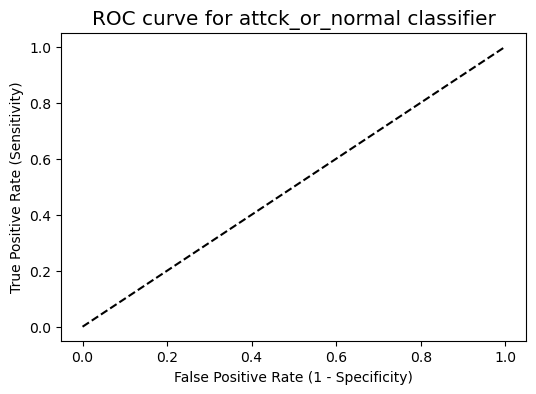

In [79]:
#ROC-AUC.
# plot ROC Curve
y_pred1 = model.predict_proba(X_test)[:,1]
from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve(y_test, y_pred1, pos_label = 'Yes')

plt.figure(figsize=(6,4))

plt.plot(fpr, tpr, linewidth=2)

plt.plot([0,1], [0,1], 'k--' )

plt.rcParams['font.size'] = 12

plt.title('ROC curve for attck_or_normal classifier')

plt.xlabel('False Positive Rate (1 - Specificity)')

plt.ylabel('True Positive Rate (Sensitivity)')
plt.show()

Text(0, 0.5, 'Frequency')

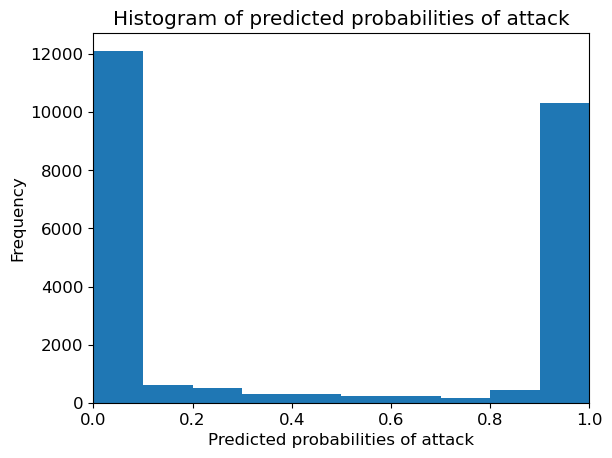

In [80]:
# plot histogram of predicted probabilities


# adjust the font size
plt.rcParams['font.size'] = 12


# plot histogram with 10 bins
plt.hist(y_pred1, bins = 10)


# set the title of predicted probabilities
plt.title('Histogram of predicted probabilities of attack')


# set the x-axis limit
plt.xlim(0,1)


# set the title
plt.xlabel('Predicted probabilities of attack')
plt.ylabel('Frequency')

In [81]:
# compute ROC AUC

from sklearn.metrics import roc_auc_score

ROC_AUC = roc_auc_score(y_test, y_pred1)

print('ROC AUC : {:.4f}'.format(ROC_AUC))

ROC AUC : 0.9936


ROC AUC is a single number summary of classifier performance. The higher the value, the better the classifier.

ROC AUC of our model approaches towards 1. So, we can conclude that our classifier does a good job in predicting whether it is attack or not.

In [82]:
##Cross Validation

# Applying 5-Fold Cross Validation

from sklearn.model_selection import cross_val_score

scores = cross_val_score(logreg, X_train, y_train, cv = 5, scoring='accuracy')

print('Cross-validation scores:{}'.format(scores))
print('Average cross-validation score: {:.4f}'.format(scores.mean()))

Cross-validation scores:[0.96204416 0.95975985 0.95861864 0.95762628 0.96114915]
Average cross-validation score: 0.9598


In [83]:
##Adjustment and Tuning:
from sklearn.model_selection import GridSearchCV

parameters = [{'penalty':['l1','l2']},
              {'C':[1, 10, 100, 1000]}]


grid_search = GridSearchCV(estimator = logreg,
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 5,
                           verbose=0)


grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=LogisticRegression(random_state=0, solver='liblinear'),
             param_grid=[{'penalty': ['l1', 'l2']}, {'C': [1, 10, 100, 1000]}],
             scoring='accuracy')

In [84]:
# examine the best model

# best score achieved during the GridSearchCV
print('GridSearch CV best score : {:.4f}\n\n'.format(grid_search.best_score_))

# print parameters that give the best results
print('Parameters that give the best results :','\n\n', (grid_search.best_params_))

# print estimator that was chosen by the GridSearch
print('\n\nEstimator that was chosen by the search :','\n\n', (grid_search.best_estimator_))

GridSearch CV best score : 0.9648


Parameters that give the best results : 

 {'C': 1000}


Estimator that was chosen by the search : 

 LogisticRegression(C=1000, random_state=0, solver='liblinear')


Our original model test accuracy is 0.9623 while GridSearch CV accuracy is 0.9647.

We can see that GridSearch CV improve the performance for this particular model.

##Conclusion
The logistic regression model accuracy score is 0.9623. So, the model does a very good job in predicting whether it is attacked.

The model shows no signs of overfitting.

ROC AUC of our model approaches towards 1. So, we can conclude that our classifier does a good job in predicting whether it is attacked or not.

Our, original model score is found to be 0.9623. The average cross-validation score is 0.9647. So, we can conclude that cross-validation does not result in performance improvement.

Our original model test accuracy is 0.9623 while GridSearch CV accuracy is 0.9647. We can see that GridSearch CV improve the performance for this particular model.



##SVM

In [85]:
# import SVC classifier
from sklearn.svm import SVC


# import metrics to compute accuracy
from sklearn.metrics import accuracy_score


# instantiate classifier with default hyperparameters
svc=SVC()


# fit classifier to training set
svc.fit(X_train,y_train)


# make predictions on test set
y_pred=svc.predict(X_test)


# compute and print accuracy score
print('Model accuracy score with default hyperparameters: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))


Model accuracy score with default hyperparameters: 0.9857


In [86]:
#Compare the train-set and test-set accuracy
#Now, I will compare the train-set and test-set accuracy to check for overfitting.

y_pred_train = svc.predict(X_train)

print('Training-set accuracy score: {0:0.4f}'. format(accuracy_score(y_train, y_pred_train)))

Training-set accuracy score: 0.9859


In [87]:
#Check overfitting or underfitting
# print the scores on training and test set

print('Training set score: {:.4f}'.format(svc.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(svc.score(X_test, y_test)))

Training set score: 0.9859
Test set score: 0.9857


The training-set accuracy score is 0.9859 while the test-set accuracy to be 0.9857. These two values are quite comparable. So, there is no question of overfitting.

In [88]:
##Confiusion Matrix
cm = confusion_matrix(y_test, y_pred)

print('Confusion matrix\n\n', cm)

print('\nTrue Positives(TP) = ', cm[0,0])

print('\nTrue Negatives(TN) = ', cm[1,1])

print('\nFalse Positives(FP) = ', cm[0,1])

print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix

 [[13418   133]
 [  228 11414]]

True Positives(TP) =  13418

True Negatives(TN) =  11414

False Positives(FP) =  133

False Negatives(FN) =  228


The confusion matrix shows 13418 + 11414 = 24832 correct predictions and 133 + 228 = 361 incorrect predictions.

In [89]:
##Classification metrices
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99     13551
           1       0.99      0.98      0.98     11642

    accuracy                           0.99     25193
   macro avg       0.99      0.99      0.99     25193
weighted avg       0.99      0.99      0.99     25193



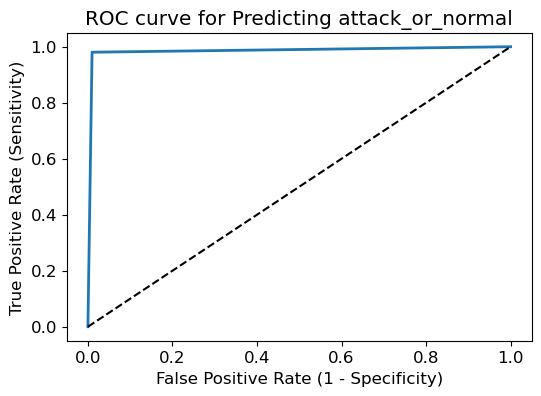

In [90]:
##ROC - AUC

fpr, tpr, thresholds = roc_curve(y_test, y_pred)

plt.figure(figsize=(6,4))

plt.plot(fpr, tpr, linewidth=2)

plt.plot([0,1], [0,1], 'k--' )

plt.rcParams['font.size'] = 12

plt.title('ROC curve for Predicting attack_or_normal')

plt.xlabel('False Positive Rate (1 - Specificity)')

plt.ylabel('True Positive Rate (Sensitivity)')

plt.show()

In [91]:
# compute ROC AUC

from sklearn.metrics import roc_auc_score

ROC_AUC = roc_auc_score(y_test, y_pred)

print('ROC AUC : {:.4f}'.format(ROC_AUC))

ROC AUC : 0.9853


ROC AUC is a single number summary of classifier performance. The higher the value, the better the classifier.

ROC AUC of our model approaches towards 1. So, we can conclude that our classifier does a good job in classifying the pulsar star.

In [92]:
##Cross-Validation
from sklearn.model_selection import KFold

kfold=KFold(n_splits=5, shuffle=True, random_state=0)
linear_svc=SVC(kernel='linear')

linear_scores = cross_val_score(linear_svc, X_train, y_train, cv=kfold)


In [93]:
print('Stratified cross-validation scores with linear kernel:\n\n{}'.format(linear_scores))
print('Mean cross-validation score with linear kernel: {:.4f}'.format(linear_scores.mean()))

Stratified cross-validation scores with linear kernel:

[0.96333416 0.96248884 0.96224075 0.95966061 0.96363005]
Mean cross-validation score with linear kernel: 0.9623


In [94]:
##Hyperparameter tuning
# declare parameters for hyperparameter tuning
parameters = [ {'C':[1, 10, 100], 'kernel':['linear']}
              ]
grid_search = GridSearchCV(estimator = svc,param_grid = parameters,scoring = 'accuracy',cv = 5,verbose=0)
grid_search.fit(X_train, y_train)
# examine the best model

# best score achieved during the GridSearchCV
print('GridSearch CV best score : {:.4f}\n\n'.format(grid_search.best_score_))

# print parameters that give the best results
print('Parameters that give the best results :','\n\n', (grid_search.best_params_))

# print estimator that was chosen by the GridSearch
print('\n\nEstimator that was chosen by the search :','\n\n', (grid_search.best_estimator_))

GridSearch CV best score : 0.9699


Parameters that give the best results : 

 {'C': 100, 'kernel': 'linear'}


Estimator that was chosen by the search : 

 SVC(C=100, kernel='linear')


##UNSUPERVISED LEARNING


In [95]:
##K-means
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
X=scaler.fit_transform(X)
X=pd.DataFrame(X,columns=num)
X_cluster=X.copy()

In [96]:
X_cluster.describe()

,duration,protocoltype,service,flag,srcbytes,dstbytes,land,wrongfragment,urgent,hot,...,srvrerrorrate_count,srvdiffhostrate_count,dsthostrerrorrate_count,dsthostserrorrate_count,dsthostsamesrvrate_count,dsthostdiffsrvrate_count,dsthostsrvserrorrate_count,dsthostsrvrerrorrate_count,dsthostsamesrcportrate_count,dsthostsrvdiffhostrate_count
count,125964.000000,125964.000000,125964.000000,125964.000000,1.259640e+05,1.259640e+05,125964.000000,125964.000000,125964.000000,125964.000000,...,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000
mean,0.006693,0.526639,0.452575,0.697985,3.302260e-05,1.510036e-05,0.000198,0.007563,0.000037,0.002655,...,0.014082,0.023932,0.274312,0.274312,0.281849,0.069869,0.041781,0.019469,0.068365,0.014532
std,0.060702,0.213271,0.236905,0.268941,4.254126e-03,3.069927e-03,0.014087,0.084513,0.004789,0.027923,...,0.058152,0.097770,0.438426,0.438426,0.364496,0.171922,0.099592,0.112049,0.214188,0.046835
min,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.500000,0.289855,0.500000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.500000,0.347826,0.900000,3.188489e-08,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.074510,0.015294,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.500000,0.710145,0.900000,2.000052e-07,3.939120e-07,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,1.000000,0.438118,0.070000,0.028542,0.000000,0.005294,0.008941
max,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [97]:
def optimise_kmeans(data,max_k):
  means=[]
  inertias=[]
  for i in range(1,max_k):
    kmeans=KMeans(n_clusters=i)
    kmeans.fit(data)
    means.append(i)
    inertias.append(kmeans.inertia_)
  ##Generate Plot for elbow method
  plt.plot(means,inertias,'-o')
  plt.xlabel('Number of clusters')
  plt.ylabel('Inertia')
  plt.grid(True)
  plt.show()

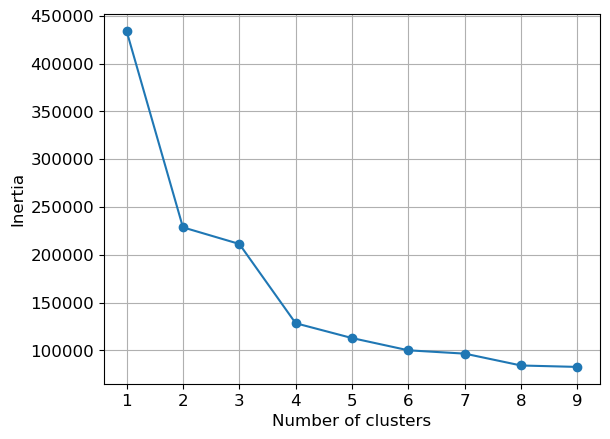

In [98]:
optimise_kmeans(X_cluster,10)

From the above plot we can see inertia(sum of the squared distances to the nearest centroid) is decreasing  as we are increasing the no of clusters. We can see sudden change in inertia when cluster is 2 and 3 .

In [99]:
kmeans=KMeans(n_clusters=3)
kmeans.fit(X_cluster)
X_cluster['kmeans3']=kmeans.labels_

In [100]:
kmeans=KMeans(n_clusters=2)
kmeans.fit(X_cluster)
X_cluster['kmeans2']=kmeans.labels_

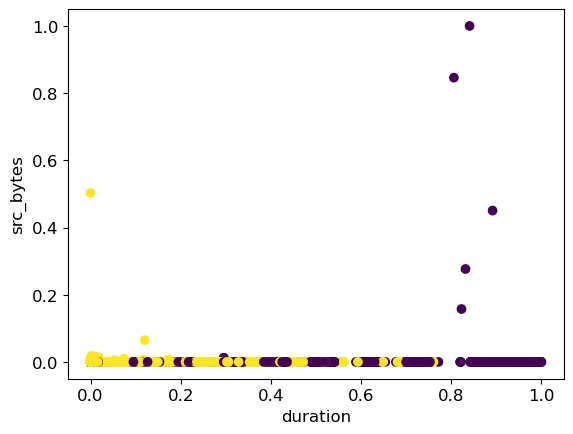

In [101]:
plt.scatter(x=X_cluster['duration'],y=X_cluster['srcbytes'],c=X_cluster['kmeans2'])
#X_cluster.plot.scatter(x=df1['attack_or_normal'],y=df1['srcbytes'],c='kmeans3',colormap='viridis')

plt.xlabel('duration')
plt.ylabel('src_bytes')
#plt.xlim(-0.1,1)
#plt.ylim(0,1.5)
plt.show()

In [102]:
X.describe()

,duration,protocoltype,service,flag,srcbytes,dstbytes,land,wrongfragment,urgent,hot,...,srvrerrorrate_count,srvdiffhostrate_count,dsthostrerrorrate_count,dsthostserrorrate_count,dsthostsamesrvrate_count,dsthostdiffsrvrate_count,dsthostsrvserrorrate_count,dsthostsrvrerrorrate_count,dsthostsamesrcportrate_count,dsthostsrvdiffhostrate_count
count,125964.000000,125964.000000,125964.000000,125964.000000,1.259640e+05,1.259640e+05,125964.000000,125964.000000,125964.000000,125964.000000,...,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000
mean,0.006693,0.526639,0.452575,0.697985,3.302260e-05,1.510036e-05,0.000198,0.007563,0.000037,0.002655,...,0.014082,0.023932,0.274312,0.274312,0.281849,0.069869,0.041781,0.019469,0.068365,0.014532
std,0.060702,0.213271,0.236905,0.268941,4.254126e-03,3.069927e-03,0.014087,0.084513,0.004789,0.027923,...,0.058152,0.097770,0.438426,0.438426,0.364496,0.171922,0.099592,0.112049,0.214188,0.046835
min,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.500000,0.289855,0.500000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.500000,0.347826,0.900000,3.188489e-08,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.074510,0.015294,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.500000,0.710145,0.900000,2.000052e-07,3.939120e-07,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,1.000000,0.438118,0.070000,0.028542,0.000000,0.005294,0.008941
max,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [103]:
cols=X.columns
cols

Index(['duration', 'protocoltype', 'service', 'flag', 'srcbytes', 'dstbytes',
       'land', 'wrongfragment', 'urgent', 'hot', 'numfailedlogins', 'loggedin',
       'numcompromised', 'rootshell', 'suattempted', 'numroot',
       'numfilecreations', 'numshells', 'numaccessfiles', 'ishostlogin',
       'isguestlogin', 'count', 'srvcount', 'serrorrate', 'srvserrorrate',
       'rerrorrate', 'srvrerrorrate', 'samesrvrate', 'diffsrvrate',
       'srvdiffhostrate', 'dsthostcount', 'dsthostsrvcount',
       'dsthostsamesrvrate', 'dsthostdiffsrvrate', 'dsthostsamesrcportrate',
       'dsthostsrvdiffhostrate', 'dsthostserrorrate', 'dsthostsrvserrorrate',
       'dsthostrerrorrate', 'dsthostsrvrerrorrate', 'srcbytes/sec',
       'dstbytes/sec', 'serrorrate_count', 'rerrorrate_count',
       'samesrvrate_count', 'diffsrvrate_count', 'srvserrorrate_count',
       'srvrerrorrate_count', 'srvdiffhostrate_count',
       'dsthostrerrorrate_count', 'dsthostserrorrate_count',
       'dsthostsamesrvrate_

In [104]:
scaler=StandardScaler()
for i in cols:
  X[i+"_"]=scaler.fit_transform(X[[i]])
X=pd.DataFrame(X,columns=cols)
X.describe()

,duration,protocoltype,service,flag,srcbytes,dstbytes,land,wrongfragment,urgent,hot,...,srvrerrorrate_count,srvdiffhostrate_count,dsthostrerrorrate_count,dsthostserrorrate_count,dsthostsamesrvrate_count,dsthostdiffsrvrate_count,dsthostsrvserrorrate_count,dsthostsrvrerrorrate_count,dsthostsamesrcportrate_count,dsthostsrvdiffhostrate_count
count,125964.000000,125964.000000,125964.000000,125964.000000,1.259640e+05,1.259640e+05,125964.000000,125964.000000,125964.000000,125964.000000,...,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000,125964.000000
mean,0.006693,0.526639,0.452575,0.697985,3.302260e-05,1.510036e-05,0.000198,0.007563,0.000037,0.002655,...,0.014082,0.023932,0.274312,0.274312,0.281849,0.069869,0.041781,0.019469,0.068365,0.014532
std,0.060702,0.213271,0.236905,0.268941,4.254126e-03,3.069927e-03,0.014087,0.084513,0.004789,0.027923,...,0.058152,0.097770,0.438426,0.438426,0.364496,0.171922,0.099592,0.112049,0.214188,0.046835
min,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.500000,0.289855,0.500000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.500000,0.347826,0.900000,3.188489e-08,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.074510,0.015294,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.500000,0.710145,0.900000,2.000052e-07,3.939120e-07,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,1.000000,0.438118,0.070000,0.028542,0.000000,0.005294,0.008941
max,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [105]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 125964 entries, 0 to 125972
Data columns (total 58 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   duration                      125964 non-null  int64  
 1   protocoltype                  125964 non-null  object 
 2   service                       125964 non-null  object 
 3   flag                          125964 non-null  object 
 4   srcbytes                      125964 non-null  int64  
 5   dstbytes                      125964 non-null  int64  
 6   land                          125964 non-null  int64  
 7   wrongfragment                 125964 non-null  int64  
 8   urgent                        125964 non-null  int64  
 9   hot                           125964 non-null  int64  
 10  numfailedlogins               125964 non-null  int64  
 11  loggedin                      125964 non-null  int64  
 12  numcompromised                125964 non-null  in

In [106]:
df2_clust=df2.copy()


In [107]:

from sklearn.ensemble import IsolationForest

clf=IsolationForest(n_estimators=100, max_samples='auto', contamination=float(0.1),max_features=1.0)
clf.fit(X_train)


IsolationForest(contamination=0.1)

In [108]:

y_pred_train=clf.predict(X_train)

In [109]:
y_pred_test=clf.predict(X_test)

In [110]:
print(y_pred_train)
print(y_pred_test)

[ 1  1  1 ...  1 -1  1]
[-1  1  1 ...  1  1  1]


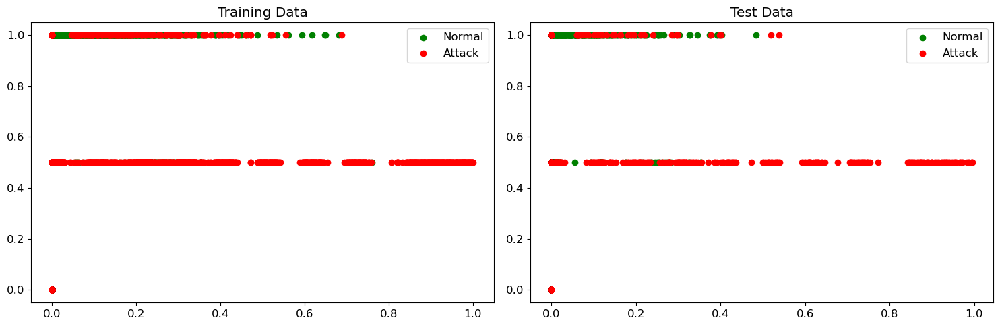

In [111]:
def create_scatter_plot(X1,y1,title1,X2,y2,title2):
  fig,axes=plt.subplots(1,2,figsize=(15,5))
  #axes[0].scatter(X1[y1==1,0],X1[y1==1,1],color='green',label='Normal')
  #axes[0].scatter(X1[y1==-1,0],X1[y1==-1, 1],color='red',label='Attack')
  axes[0].scatter(X1.loc[y1 == 1].iloc[:, 0], X1.loc[y1 == 1].iloc[:, 1], color='green', label='Normal')
  axes[0].scatter(X1.loc[y1 == -1].iloc[:, 0], X1.loc[y1 == -1].iloc[:, 1], color='red', label='Attack')
  axes[0].set_title(title1)
  axes[0].legend()

  #axes[1].scatter(X2[y2==1,0],X2[y2==1,1],color='green',label='Normal')
  #axes[1].scatter(X1[y2==-1,0],X1[y2==-1, 1],color='red',label='Attack')
  axes[1].scatter(X2.loc[y2 == 1].iloc[:, 0], X2.loc[y2 == 1].iloc[:, 1], color='green', label='Normal')
  axes[1].scatter(X2.loc[y2 == -1].iloc[:, 0], X2.loc[y2 == -1].iloc[:, 1], color='red', label='Attack')
  axes[1].set_title(title2)
  axes[1].legend()
  plt.tight_layout()
  plt.show()

create_scatter_plot(X_train,y_pred_train,'Training Data',X_test,y_pred_test,'Test Data')

In [112]:
import pickle

# Open the file in binary mode 
#with open('file.pkl', 'rb') as file: 
      
    # Call load method to deserialze 
    #
    # myvar = pickle.load(file) 
with open('Anomaly.pkl',wb) as f:
    pickle.dump(clf,f)
    

NameError: name 'wb' is not defined